# explore Data

In [37]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px

In [2]:
df = pd.read_csv(r"C:\Users\Maydoum\Downloads\Compressed\apartments_pl_2024_01.csv")


In [3]:
df.drop(columns=['collegeDistance' , 'restaurantDistance'] , inplace= True)

In [4]:
df.head().T

,0,1,2,3,4
id,a01d82c9529f98a54d64b9e061c9a73b,8373aa373dbc3fe7ca3b7434166b8766,7d0c31d5409caab173571cce3dcdf702,3eaa36a59b9354206703b5f6b2f2ff1d,027b30cebbc49faf3094421b741ddd56
city,szczecin,szczecin,szczecin,szczecin,szczecin
type,apartmentBuilding,tenement,blockOfFlats,blockOfFlats,blockOfFlats
squareMeters,105.0,73.02,68.61,42.0,45.5
rooms,4.0,3.0,3.0,2.0,2.0
floor,3.0,2.0,4.0,1.0,4.0
floorCount,4.0,3.0,4.0,3.0,4.0
buildYear,2016.0,NaN,1997.0,NaN,1960.0
latitude,53.431503,53.452222,53.456213,53.468056,53.438165
longitude,14.48582,14.553333,14.583222,14.538333,14.5632


In [5]:
df.shape

(15521, 26)

In [6]:
df.columns

Index(['id', 'city', 'type', 'squareMeters', 'rooms', 'floor', 'floorCount',
       'buildYear', 'latitude', 'longitude', 'centreDistance', 'poiCount',
       'schoolDistance', 'clinicDistance', 'postOfficeDistance',
       'kindergartenDistance', 'pharmacyDistance', 'ownership',
       'buildingMaterial', 'condition', 'hasParkingSpace', 'hasBalcony',
       'hasElevator', 'hasSecurity', 'hasStorageRoom', 'price'],
      dtype='object')

In [7]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15521 entries, 0 to 15520
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    15521 non-null  object 
 1   city                  15521 non-null  object 
 2   type                  12065 non-null  object 
 3   squareMeters          15521 non-null  float64
 4   rooms                 15521 non-null  float64
 5   floor                 12707 non-null  float64
 6   floorCount            15329 non-null  float64
 7   buildYear             13020 non-null  float64
 8   latitude              15521 non-null  float64
 9   longitude             15521 non-null  float64
 10  centreDistance        15521 non-null  float64
 11  poiCount              15521 non-null  float64
 12  schoolDistance        15503 non-null  float64
 13  clinicDistance        15464 non-null  float64
 14  postOfficeDistance    15496 non-null  float64
 15  kindergartenDistanc

## missing values 

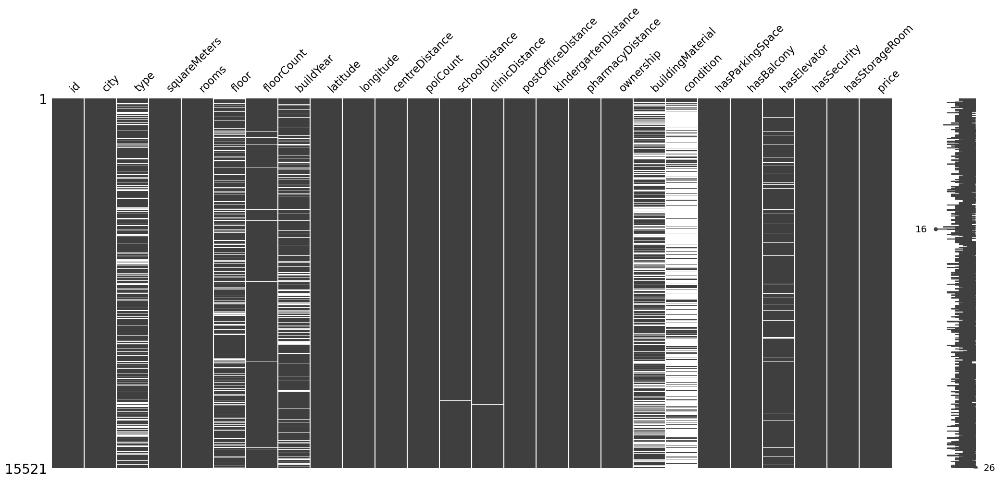

In [8]:
import missingno as msno
msno.matrix(df)
plt.show()

In [9]:
df.isnull().mean()

id                      0.000000
city                    0.000000
type                    0.222666
squareMeters            0.000000
rooms                   0.000000
floor                   0.181303
floorCount              0.012370
buildYear               0.161137
latitude                0.000000
longitude               0.000000
centreDistance          0.000000
poiCount                0.000000
schoolDistance          0.001160
clinicDistance          0.003672
postOfficeDistance      0.001611
kindergartenDistance    0.001417
pharmacyDistance        0.001740
ownership               0.000000
buildingMaterial        0.385993
condition               0.762580
hasParkingSpace         0.000000
hasBalcony              0.000000
hasElevator             0.050383
hasSecurity             0.000000
hasStorageRoom          0.000000
price                   0.000000
dtype: float64

# data cleaning


In [10]:
df.drop(columns=['condition' , 'id' , 'buildingMaterial'], inplace=True)

In [11]:

df.duplicated().sum()

153

In [12]:
df.drop_duplicates(inplace=True)

In [13]:
df.dropna(subset=[ 'schoolDistance' , 'hasElevator','pharmacyDistance',
                  'kindergartenDistance', 'postOfficeDistance' , 'floorCount' , 'clinicDistance',  
                   'poiCount']
          , inplace=True) # drop rows with missing values

In [14]:
# divide into train and test

from sklearn.model_selection import train_test_split
x_train  = df.drop(columns=['price'])
y_train = df['price']

x_train , x_test , y_train , y_test = train_test_split(x_train , y_train , test_size=0.2 , random_state=42)


In [15]:
#fill missing values
df['type'].fillna(x_train['type'].mode()[0] , inplace=True)           
df['floor'].fillna(x_train['floor'].mode()[0] ,inplace = True)
df['floorCount'].fillna(x_train['floorCount'].mode()[0] ,inplace = True)
df['buildYear'].fillna(x_train['buildYear'].mode()[0] , inplace=True)

## check data after cleaning 

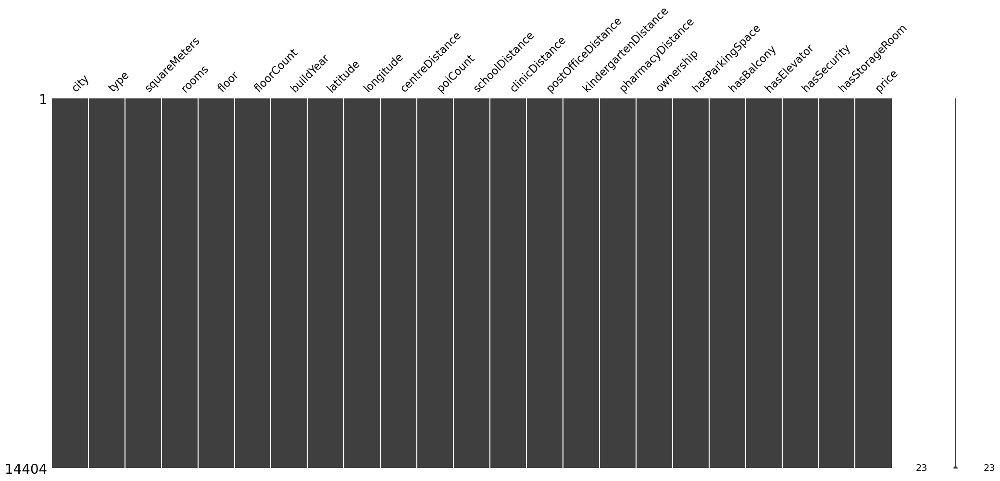

In [16]:
msno.matrix(df)
plt.show()

# describe data 

In [17]:
df.describe(include='O')

,city,type,ownership,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom
count,14404,14404,14404,14404,14404,14404,14404,14404
unique,15,3,3,2,2,2,2,2
top,warszawa,blockOfFlats,condominium,no,yes,yes,no,no
freq,4157,9371,13077,10274,8661,7243,12616,8100


In [18]:
df.describe()

,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,centreDistance,poiCount,schoolDistance,clinicDistance,postOfficeDistance,kindergartenDistance,pharmacyDistance,price
count,14404.000000,14404.000000,14404.000000,14404.000000,14404.000000,14404.000000,14404.000000,14404.000000,14404.000000,14404.000000,14404.000000,14404.000000,14404.000000,14404.000000,1.440400e+04
mean,60.273312,2.734171,2.940086,5.315329,1992.294016,52.046862,19.401737,4.257161,20.936893,0.415088,0.967472,0.517846,0.369447,0.358190,8.218055e+05
std,22.129492,0.935805,2.472585,3.311165,34.374402,1.363930,1.782671,2.794109,24.848655,0.469451,0.889602,0.504658,0.448247,0.464658,4.315348e+05
min,25.000000,1.000000,1.000000,1.000000,1850.000000,49.982200,14.447127,0.020000,0.000000,0.002000,0.001000,0.001000,0.001000,0.001000,1.749000e+05
25%,45.000000,2.000000,1.000000,3.000000,1970.000000,51.107030,18.503538,1.920000,7.000000,0.177000,0.351000,0.240000,0.156000,0.142000,5.500000e+05
50%,56.000000,3.000000,2.000000,4.000000,2007.000000,52.195080,19.574775,3.885000,14.000000,0.293000,0.676000,0.397000,0.264000,0.240000,7.290000e+05
75%,70.567500,3.000000,4.000000,6.000000,2022.000000,52.448448,20.979472,6.072500,24.000000,0.474000,1.237000,0.623000,0.421000,0.403000,9.750000e+05
max,150.000000,6.000000,29.000000,29.000000,2024.000000,54.571500,23.201891,16.510000,212.000000,4.692000,4.940000,4.905000,4.680000,4.861000,3.250000e+06


# analyze data

 ### Which governorates have the highest average price for properties with more than three rooms?

In [20]:
filtered_df = df[df['rooms'] > 3]

# Group by 'city' (or 'governorate' if that's the actual column name) and calculate the mean price
governorates_avg_price = filtered_df.groupby('city')['price'].mean().reset_index()

# Sort by the highest average price
top_5_governorates = governorates_avg_price.sort_values(by='price', ascending=False).head(5)

# Draw a bar chart
px.bar(top_5_governorates, x='city', y='price', template='plotly_dark',
       color_discrete_sequence=px.colors.sequential.Electric_r, title='Top 5 Governorates with Highest Average Price')


## The 5 expensive  apartments in any governorate

In [26]:
max_price = df.groupby('city')['price'].max().reset_index().sort_values(ascending=False , by='price').head(5)
#draw chart 
px.bar (max_price , x='city' , y='price' , template='plotly_dark' ,labels={'city':'City' , 'price':'Max Price'},
        color_discrete_sequence=px.colors.sequential.Electric_r, title='Top 5 cities with highest price')

## The five cities with the most ancient buildings

In [27]:
oldest  = df.sort_values(by='buildYear').head(5)
oldest
px.bar(oldest , x='city' , y='buildYear' , template='plotly_dark' ,labels={'city':'City' , 'buildYear':'Build Year'},
        color_discrete_sequence=px.colors.sequential.Electric_r, title='Oldest city')

In [28]:
px.bar (max_price , x='city' , y='price' , template='plotly_dark' ,labels={'city':'City' , 'price':'Max Price'},
        color_discrete_sequence=px.colors.sequential.Electric_r, title='Top 5 cities with highest price' , color='price')
    

## The five most expensive governorates have the highest price per meter

In [29]:
df['price_per_meter'] = df['price'] / df['squareMeters']

price_per_meter_group = df.groupby('city')['price_per_meter'].mean().sort_values(ascending=False)
px.bar(price_per_meter_group.reset_index() , x='city' , y='price_per_meter' , template='plotly_dark' ,labels={'city':'City' , 'price_per_meter':'Price per meter'},
        color_discrete_sequence=px.colors.sequential.Electric_r, title='Top 5 cities with highest price per meter')

## Which properties have the most amenities

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Create a new column that counts the number of amenities each property has
amenities_columns = ['hasParkingSpace', 'hasBalcony', 'hasElevator', 'hasSecurity', 'hasStorageRoom']

for col in amenities_columns:
    df[col] = df[col].apply(lambda x: 1 if x.lower() == 'yes' else 0)

df['amenities_count'] = df[amenities_columns].sum(axis=1)
amenities_columns_group = df.sort_values(by='amenities_count', ascending=False).head(5)

# Step 2: Create a bar chart
px.bar(amenities_columns_group , x='city' , y='amenities_count' , template='plotly_dark' ,labels={'city':'City' , 'amenities_count':'Number of amenities'},
        color_discrete_sequence=px.colors.sequential.Electric_r, title='Top 3 cities with highest number of amenities')





In [31]:
df.sort_values(by='squareMeters' and 'price' , ascending=False).head(5).T

,10641,14445,10630,14231,11267
city,warszawa,warszawa,warszawa,warszawa,warszawa
type,apartmentBuilding,apartmentBuilding,blockOfFlats,apartmentBuilding,blockOfFlats
squareMeters,133.51,133.51,122.0,115.0,115.0
rooms,6.0,6.0,4.0,4.0,4.0
floor,4.0,4.0,2.0,4.0,4.0
floorCount,4.0,4.0,3.0,5.0,5.0
buildYear,2018.0,2017.0,1983.0,2016.0,2023.0
latitude,52.15441,52.15552,52.22436,52.221242,52.2212
longitude,21.07143,21.07395,21.06275,20.983033,20.9834
centreDistance,9.76,9.74,4.11,1.82,1.8


## univarte  all coloums 

In [32]:
city_group  = df.groupby('city')['longitude'].count().reset_index().sort_values(ascending=False , by='city')
city_group

,city,longitude
14,wroclaw,1627
13,warszawa,4157
12,szczecin,476
11,rzeszow,145
10,radom,218
9,poznan,545
8,lublin,366
7,lodz,1112
6,krakow,2136
5,katowice,398


In [33]:
px.bar(city_group, x='city',y = 'longitude' ,color='city',template='plotly_dark', title='Number of properties per city' ,color_discrete_sequence=px.colors.sequential.Electric_r,  labels={'city':'City' , 'longitude':'Number of properties'})

In [34]:
group_sqare = df.groupby('squareMeters')['longitude'].count().reset_index().sort_values(by='longitude' , ascending=False)
group_sqare

,squareMeters,longitude
1132,48.00,179
1280,50.00,171
1065,47.00,154
1208,49.00,154
516,38.00,154
...,...,...
2329,66.98,1
2328,66.97,1
2326,66.95,1
2325,66.93,1


In [35]:
px.histogram(df, x = 'squareMeters' , nbins=15, color_discrete_sequence=px.colors.sequential.Electric_r,template='plotly_dark', title='Number of properties per square meters')

In [36]:

top_10 = df.groupby('rooms')['longitude'].count().reset_index().sort_values(by = 'rooms' , ascending=False)
top_10

,rooms,longitude
5,6.0,152
4,5.0,429
3,4.0,1969
2,3.0,5475
1,2.0,5646
0,1.0,733


In [37]:
px.bar(top_10, x = 'rooms', color='rooms' , y = 'longitude' ,
         color_discrete_sequence=px.colors.sequential.Electric_r,template='plotly_dark',
           title='Number of properties per rooms' , labels={'rooms':'Number of rooms' , 'longitude':'Number of properties'})

In [38]:
group_type = df.groupby('type')['longitude'].count().reset_index().sort_values(by = 'longitude' , ascending=False)
group_type

,type,longitude
1,blockOfFlats,9371
0,apartmentBuilding,2782
2,tenement,2251


In [39]:
px.pie(group_type , names= 'type' ,values='longitude' ,  color_discrete_sequence=px.colors.sequential.Electric_r,template='plotly_dark', title='Number of properties per type' , hole=.3)

In [40]:
px.histogram(df , x = 'floor' , color='floor' ,color_discrete_sequence=px.colors.sequential.Electric_r ,
             template='plotly_dark' , title= 'Number of floor' , labels={'count' :'Number of properties'} )

In [41]:
year = df.groupby('buildYear')['longitude'].count().reset_index().sort_values(by = 'buildYear' , ascending=False)
year

,buildYear,longitude
150,2024.0,134
149,2023.0,2916
148,2022.0,667
147,2021.0,337
146,2020.0,278
...,...,...
4,1870.0,5
3,1865.0,1
2,1860.0,2
1,1852.0,1


In [42]:
fig = px.line(year , x = 'buildYear' , y = 'longitude' , template='plotly_dark' ,
              color_discrete_sequence=px.colors.sequential.Electric_r )
fig.update_xaxes(range=[1900, 2024])  

In [43]:
df['centreDistance'].mean()

4.257160510969175

In [44]:
q1 = df['centreDistance'].quantile(0.25)
q3 = df['centreDistance'].quantile(0.75)
iqr = q3 - q1
max_value_centre = q3 + 1.5 * iqr
max_value_centre
px.box(df , x = 'centreDistance')

In [45]:

bins = [0.02, 3.1,4.257,12.28 ]  
labels = ['Near', 'Medium', 'Far']
df['distance_group'] = pd.cut(df['centreDistance'], bins=bins, labels=labels)
px.histogram(df, x='distance_group', title='Distribution of Distance Groups to Center',
              color_discrete_sequence=px.colors.sequential.Electric_r
             ,color='distance_group' , template='plotly_dark')



In [46]:
px.histogram(df, x='poiCount', title='Count of Points of Interest in 500m Range',  color_discrete_sequence=px.colors.sequential.Electric_r
              , template='plotly_dark')


In [47]:
q1 = df['schoolDistance'].quantile(0.25)
q3 = df['schoolDistance'].quantile(0.75)
iqr = q3 - q1
max_value_centre = q3 + 1.5 * iqr
max_value_centre
df['schoolDistance'].mean()

0.41508810052763123

In [48]:

bins = [0,0.1,0.415,5 ]  
labels = ['Near', 'Medium', 'Far']
df['distance_school_group'] = pd.cut(df['schoolDistance'], bins=bins, labels=labels)
px.pie(df, names='distance_school_group', title='Distribution of Distance Groups to School',
              color_discrete_sequence=px.colors.sequential.Jet
             ,color='distance_school_group' , template='plotly_dark' , hole=.4)



In [49]:
q1 = df['clinicDistance'].quantile(0.25)
q3 = df['clinicDistance'].quantile(0.75)
iqr = q3 - q1
max_value_centre = q3 + 1.5 * iqr
max_value_centre

2.5660000000000003

In [50]:
bins = [0,0.4,0.9,2.56]  
labels = ['Near', 'Medium', 'Far']
df['distance_clinic_group'] = pd.cut(df['clinicDistance'], bins=bins, labels=labels)
px.histogram(df, x='distance_clinic_group', title='Distribution of Distance Groups to Clinic',
              color_discrete_sequence=px.colors.sequential.Electric_r
             ,color='distance_clinic_group' , template='plotly_dark' )


In [51]:
q1 = df['postOfficeDistance'].quantile(0.25)
q3 = df['postOfficeDistance'].quantile(0.75)
iqr = q3 - q1
max_value_centre = q3 + 1.5 * iqr
max_value_centre

1.1975

In [52]:
bins = [0,0.22,0.49,1.1975 ]  
labels = ['Near', 'Medium', 'Far']
df['distance_post_group'] = pd.cut(df['postOfficeDistance'], bins=bins, labels=labels)
px.histogram(df, x='distance_post_group', title='Distribution of Distance Groups to Post Office',
              color_discrete_sequence=px.colors.sequential.Electric_r
             ,color='distance_post_group' , template='plotly_dark' )

In [53]:
q1 = df['kindergartenDistance'].quantile(0.25)
q3 = df['kindergartenDistance'].quantile(0.75)
iqr = q3 - q1
max_value_centre = q3 + 1.5 * iqr
max_value_centre

0.8185

In [54]:
bins = [0,0.22,0.34,0.816 ]  
labels = ['Near', 'Medium', 'Far']
df['distance_kinder_group'] = pd.cut(df['kindergartenDistance'], bins=bins, labels=labels)
px.histogram(df, x='distance_kinder_group', title='Distribution of Distance Groups to Kindergarten',
              color_discrete_sequence=px.colors.sequential.Electric_r
             ,color='distance_kinder_group' , template='plotly_dark' )

In [55]:
px.box(df , x = 'pharmacyDistance')
q1 = df['pharmacyDistance'].quantile(0.25)
q3 = df['pharmacyDistance'].quantile(0.75)
iqr = q3 - q1
max_value = q3 + 1.5 * iqr
max_value

0.7945

In [56]:
px.histogram(df , x  = 'pharmacyDistance' )

In [57]:
bins = [0,0.22,0.334,.7945]  
labels = ['Near', 'Medium', 'Far']
df['distance_pharmacy_group'] = pd.cut(df['pharmacyDistance'], bins=bins, labels=labels)
px.histogram(df, x='distance_pharmacy_group', title='Distribution of Distance Groups to Pharmacy',
              color_discrete_sequence=px.colors.sequential.Electric_r
             ,color='distance_pharmacy_group' , template='plotly_dark' )

In [58]:
ownership_group = df.groupby('ownership')['longitude'].count().reset_index().sort_values(by='ownership' , ascending=False)

In [59]:
px.bar(ownership_group , x= 'ownership' ,y='longitude' ,  color_discrete_sequence=px.colors.sequential.Electric_r,
       template='plotly_dark', title='Number of properties per ownership'  , labels={'ownership':'Ownership' , 'longitude':'Number of properties'})

In [60]:
parking_group = df.groupby('hasParkingSpace')['longitude'].count().reset_index().sort_values(by='hasParkingSpace' ,
                                                                                              ascending=False)

In [61]:
px.bar(parking_group , x= 'hasParkingSpace' ,y='longitude' ,  color_discrete_sequence=px.colors.sequential.Electric_r ,
       template='plotly_dark', title='Number of properties per parking'  , labels={'hasParkingSpace':'Parking' , 'longitude':'Number of properties'})

In [62]:
balcony_group = df.groupby('hasBalcony')['longitude'].count().reset_index().sort_values(by='hasBalcony' ,
                                                                                              ascending=False)

In [63]:
px.bar(balcony_group , x= 'hasBalcony' ,y='longitude' ,  color_discrete_sequence=px.colors.sequential.Electric_r ,
       template='plotly_dark', title='Number of properties per balcony'  , labels={'hasBalcony':'Balcony' , 'longitude':'Number of properties'})

In [64]:
elevator_group = df.groupby('hasElevator')['longitude'].count().reset_index().sort_values(by='hasElevator' ,
                                                                                              ascending=False)

In [65]:
px.bar(elevator_group , x= 'hasElevator' ,y='longitude' ,  color_discrete_sequence=px.colors.sequential.Electric_r ,
       template='plotly_dark', title='Number of properties per elevator'  , labels={'hasElevator':'Elevator' , 'longitude':'Number of properties'})

In [66]:
security_group = df.groupby('hasSecurity')['longitude'].count().reset_index().sort_values(by='hasSecurity' ,
                                                                                              ascending=False)

In [67]:
px.bar(security_group , x= 'hasSecurity' ,y='longitude' ,  color_discrete_sequence=px.colors.sequential.Electric_r ,
       template='plotly_dark', title='Number of properties per security'  , labels={'hasSecurity':'Security' , 'longitude':'Number of properties'})

In [68]:
storage_group = df.groupby('hasStorageRoom')['longitude'].count().reset_index().sort_values(by='hasStorageRoom' ,
                                                                                              ascending=False)

In [69]:
px.bar(storage_group , x= 'hasStorageRoom' ,y='longitude' ,  color_discrete_sequence=px.colors.sequential.Electric_r ,
       template='plotly_dark', title='Number of properties per storage room'  , labels={'hasStorageRoom':'Storage Room' , 'longitude':'Number of properties'})

In [70]:
px.box(df , x = 'price' , template= 'plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r )


## bivarite

In [71]:
df.groupby('type')['price'].mean().reset_index().sort_values(by = 'price')

,type,price
1,blockOfFlats,7.418069e+05
2,tenement,8.764331e+05
0,apartmentBuilding,1.047075e+06


In [72]:
px.bar(df.groupby('type')['price'].mean().reset_index() , x = 'price', y = 'type' , template= 'plotly_dark' ,
       color_discrete_sequence=px.colors.sequential.Electric_r 
       )

In [73]:
df.groupby('city')['price'].mean().reset_index()

,city,price
0,bialystok,4.780955e+05
1,bydgoszcz,4.359015e+05
2,czestochowa,3.632527e+05
3,gdansk,8.884782e+05
4,gdynia,8.990452e+05
5,katowice,5.190778e+05
6,krakow,9.585965e+05
7,lodz,4.529754e+05
8,lublin,5.696942e+05
9,poznan,6.769523e+05


In [74]:
px.bar( df.groupby('city')['price'].mean().reset_index(), x= 'price' , y = 'city' , template= 'plotly_dark' ,
       color_discrete_sequence=px.colors.sequential.Electric_r , color='price'
       )

In [75]:
px.scatter(df , x = 'squareMeters' , y = 'price' , template= 'plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r )

In [76]:
df.groupby('rooms')['price'].median().reset_index()

,rooms,price
0,1.0,479000.0
1,2.0,630000.0
2,3.0,795000.0
3,4.0,980000.0
4,5.0,1190000.0
5,6.0,1650000.0


In [77]:
px.bar(df.groupby('rooms')['price'].median().reset_index() , x = 'rooms' , y= 'price' , template= 'plotly_dark' ,
       color_discrete_sequence=px.colors.sequential.Electric_r ,color='rooms', title='Average apartment prices for rooms')

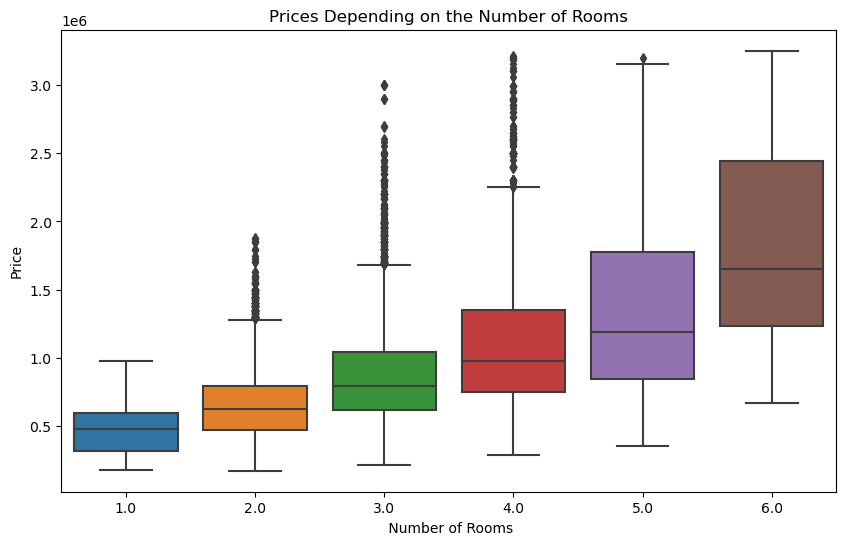

In [78]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='rooms', y='price', data=df)

plt.xlabel(' Number of Rooms')
plt.ylabel('Price')
plt.title('Prices Depending on the Number of Rooms')
plt.show()

In [79]:
px.line(df.groupby('floor')['price'].sum().reset_index().sort_values(by='floor') , x= 'floor' , y= 'price' , template= 'plotly_dark' ,
        color_discrete_sequence=px.colors.sequential.Electric_r , title= 'Total price VS floor' )

In [80]:

px.bar(df.groupby('floorCount')['price'].mean().reset_index().sort_values(by='price' , ascending=False) , x= 'floorCount' , y= 'price' , template= 'plotly_dark' ,
        color_discrete_sequence=px.colors.sequential.Electric_r , title= 'price VS floorCount' ) 

In [81]:

bins = [0,0.22,0.334,5 ]  
labels = ['Near', 'Medium', 'Far']
df['distance_pharmacy_group'] = pd.cut(df['pharmacyDistance'], bins=bins, labels=labels)
px.histogram(df, x='distance_pharmacy_group', title='Distribution of Distance Groups to Pharmacy',
              color_discrete_sequence=px.colors.sequential.Electric_r
             ,color='distance_pharmacy_group' , template='plotly_dark' )


In [82]:
bins = [1850 ,1900, 2000, 2024]  
labels = ['old', 'medium', 'modren']
df['distance_year_group'] = pd.cut(df['buildYear'], bins=bins, labels=labels)
df.head().T

,0,1,2,3,4
city,szczecin,szczecin,szczecin,szczecin,szczecin
type,apartmentBuilding,tenement,blockOfFlats,blockOfFlats,blockOfFlats
squareMeters,105.0,73.02,68.61,42.0,45.5
rooms,4.0,3.0,3.0,2.0,2.0
floor,3.0,2.0,4.0,1.0,4.0
floorCount,4.0,3.0,4.0,3.0,4.0
buildYear,2016.0,2023.0,1997.0,2023.0,1960.0
latitude,53.431503,53.452222,53.456213,53.468056,53.438165
longitude,14.48582,14.553333,14.583222,14.538333,14.5632
centreDistance,5.06,3.24,3.94,5.19,1.65


In [83]:
df.groupby('distance_year_group')['price'].mean().reset_index().sort_values(by='price')

,distance_year_group,price
1,medium,749187.950718
2,modren,875061.531793
0,old,885733.855019


In [84]:
px.bar(df.groupby('distance_year_group')['price'].sum().reset_index().sort_values(by='price')
     , x='distance_year_group' , y = 'price' , template= 'plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r ,color='distance_year_group')

In [85]:
px.bar(df.groupby('distance_group')['price'].mean().reset_index().sort_values(by='price') ,
        x= 'price' , y='distance_group', template='plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r ,color='distance_group'  , title= 'price VS distance_center ')

In [86]:
px.bar(df.groupby('distance_school_group')['price'].mean().reset_index().sort_values(by='price') ,
        x= 'price' , y='distance_school_group', template='plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r ,color='distance_school_group'  , title= 'price VS distance_school ')

In [87]:
px.pie(df.groupby('distance_pharmacy_group')['price'].mean().reset_index().sort_values(by='price') ,
        values= 'price' , names='distance_pharmacy_group', template='plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r ,color='distance_pharmacy_group'  , title= 'price VS distance_pharmacy ' , hole=0.3)

In [88]:
px.bar(df.groupby('distance_clinic_group')['price'].mean().reset_index().sort_values(by='price') ,
        x= 'price' , y='distance_clinic_group', template='plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r ,color='distance_clinic_group'  , title= 'price VS distance_clinic ')

In [89]:
px.bar(df.groupby('distance_post_group')['price'].mean().reset_index().sort_values(by='price') ,
        y= 'price' , x='distance_post_group', template='plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r ,color='distance_post_group'  , title= 'price VS distance_post ')

In [90]:
px.bar(df.groupby('distance_kinder_group')['price'].mean().reset_index().sort_values(by='price') ,
        x= 'price' , y='distance_kinder_group', template='plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r ,color='distance_kinder_group'  , title= 'price VS distance_kindergarten ')

In [91]:
px.bar(df.groupby('ownership')['price'].mean().reset_index().sort_values(by='price') ,
        x = 'price' , y = 'ownership' 
        , template='plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r ,color='price'  , title= 'price VS ownership ')

In [92]:
px.bar(df.groupby('hasSecurity')['price'].mean().reset_index().sort_values(by='price') , x= 'price' , y = 'hasSecurity'  , template='plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r ,color='price'  , title= 'price VS hasSecurity ' )

In [93]:
px.bar(df.groupby('hasParkingSpace')['price'].mean().reset_index().sort_values(by='price') , x= 'price' , y = 'hasParkingSpace'  , template='plotly_dark' ,color_discrete_sequence=px.colors.sequential.Greens_r ,color='price'  , title= 'price VS hasParkingSpace ' )

In [94]:
px.bar(df.groupby('hasElevator')['price'].mean().reset_index().sort_values(by='price') , y= 'hasElevator' , x = 'price'
         , template='plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r ,color='price'  , title= 'price VS hasElevator ' )

In [95]:
px.bar(df.groupby('hasStorageRoom')['price'].mean().reset_index().sort_values(by='price') , y= 'hasStorageRoom' , x = 'price'
         , template='plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r ,color='price'  , title= 'price VS hasStorageroom ' )

In [96]:
px.bar(df.groupby('hasBalcony')['price'].mean().reset_index().sort_values(by='price') , y= 'hasBalcony' , x = 'price'
         , template='plotly_dark' ,color_discrete_sequence=px.colors.sequential.Electric_r ,color='price'  , title= 'price VS hasBalcony ' )

In [97]:
#cut squaremeters catageroies
df['squareMeters_cat'] = pd.cut(df['squareMeters'] , bins = [0 , 50 , 100 ,150] , labels = [">50" , "50-100" , "<100"])

In [98]:
df.groupby(['distance_year_group', 'squareMeters_cat'])['price'].mean().reset_index().sort_values(by='price')

,distance_year_group,squareMeters_cat,price
0,old,>50,4.873105e+05
3,medium,>50,5.561980e+05
6,modren,>50,6.202903e+05
4,medium,50-100,8.045585e+05
1,old,50-100,8.864339e+05
7,modren,50-100,9.652138e+05
2,old,<100,1.422732e+06
5,medium,<100,1.482767e+06
8,modren,<100,1.691243e+06


In [99]:
px.bar(df.groupby(['rooms' , 'distance_clinic_group'])['price'].mean().reset_index().sort_values(by='price') ,
    x = 'rooms' , y = 'price' , color='distance_clinic_group' , color_discrete_sequence=px.colors.sequential.Electric_r , title= 'price VS rooms VS distance_clinic' , 
     barmode='group' , template='plotly_dark' )

In [100]:
grouped_df = df.groupby(['rooms', 'hasSecurity'])['price'].mean().reset_index()
px.line(grouped_df, x='rooms', y='price', color='hasSecurity',
             labels={'rooms': 'Number of Rooms', 'price': 'Average Price (PLN)', 'hasSecurity': 'has Security'},
             title='Average Price vs Number of Rooms by Security', template='plotly_dark',color_discrete_sequence=px.colors.sequential.Electric_r ) 



In [101]:
grouped_df = df.groupby(['rooms', 'distance_clinic_group'])['price'].mean().reset_index()

# Create the multivariate bar plot
px.bar(grouped_df, x='rooms', y='price', color='distance_clinic_group',
             labels={'rooms': 'Number of Rooms', 'price': 'Average Price (PLN)', 'distance_clinic_group': 'Distance to Clinic'},
             title='Average Price vs Number of Rooms by Distance to Clinic' , barmode='group' , template='plotly_dark',color_discrete_sequence=px.colors.sequential.Electric_r )


In [102]:
px.funnel(df,x='city',y='price',color='type')

In [103]:
px.box(df, x='squareMeters_cat', y='price', color='rooms',
             labels={'squareMeters_cat': 'Square Meters Category', 'price': 'Price (PLN)', 'rooms': 'Number of Rooms'},
             title='Price Distribution by Square Meters Category and Number of Rooms' , template='plotly_dark')


# machine learning

In [1]:
import pandas as pd

df2 = pd.read_csv(r"C:\Users\Maydoum\Downloads\Compressed\apartments_pl_2024_02.csv")

# Select only numeric columns
numeric_df = df2.select_dtypes(include=['float64', 'int64'])

# Calculate correlation coefficient
correlation = numeric_df.corr()

# Print correlation matrix
correlation



,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,centreDistance,poiCount,schoolDistance,clinicDistance,postOfficeDistance,kindergartenDistance,restaurantDistance,collegeDistance,pharmacyDistance,price
squareMeters,1.000000,0.831904,-0.070573,-0.138250,-0.028646,0.058647,-0.018737,0.033140,0.046464,0.068305,0.012643,0.066744,0.079050,0.037289,0.029685,0.062105,0.654707
rooms,0.831904,1.000000,-0.030331,-0.074213,-0.000375,0.049516,-0.006445,0.047943,0.015068,0.062424,0.031975,0.064003,0.064051,0.046140,0.036289,0.062059,0.518587
floor,-0.070573,-0.030331,1.000000,0.653114,0.069211,-0.006257,0.075327,-0.011935,0.019427,-0.093740,-0.109643,-0.056750,-0.081824,-0.071814,-0.046227,-0.088915,0.029778
floorCount,-0.138250,-0.074213,0.653114,1.000000,0.130007,-0.008261,0.109421,-0.036117,0.031624,-0.144568,-0.173453,-0.097212,-0.130347,-0.128466,-0.082487,-0.137902,0.023333
buildYear,-0.028646,-0.000375,0.069211,0.130007,1.000000,-0.001486,0.078196,0.365274,-0.379328,0.257935,0.257252,0.228112,0.116665,0.162125,0.359015,0.195187,0.138518
latitude,0.058647,0.049516,-0.006257,-0.008261,-0.001486,1.000000,-0.221588,0.073021,-0.043599,0.161110,0.113193,0.105388,0.168346,0.149359,0.109298,0.145788,0.016700
longitude,-0.018737,-0.006445,0.075327,0.109421,0.078196,-0.221588,1.000000,0.195351,0.021846,-0.099234,-0.073266,-0.043228,-0.126181,-0.108500,-0.004540,-0.057557,0.227099
centreDistance,0.033140,0.047943,-0.011935,-0.036117,0.365274,0.073021,0.195351,1.000000,-0.459471,0.287659,0.431892,0.259507,0.128035,0.237765,0.543440,0.253009,0.076220
poiCount,0.046464,0.015068,0.019427,0.031624,-0.379328,-0.043599,0.021846,-0.459471,1.000000,-0.301859,-0.365511,-0.316200,-0.203252,-0.337504,-0.449110,-0.296608,0.184233
schoolDistance,0.068305,0.062424,-0.093740,-0.144568,0.257935,0.161110,-0.099234,0.287659,-0.301859,1.000000,0.573284,0.759688,0.771434,0.771705,0.449420,0.800622,-0.007305


## preproceesing 

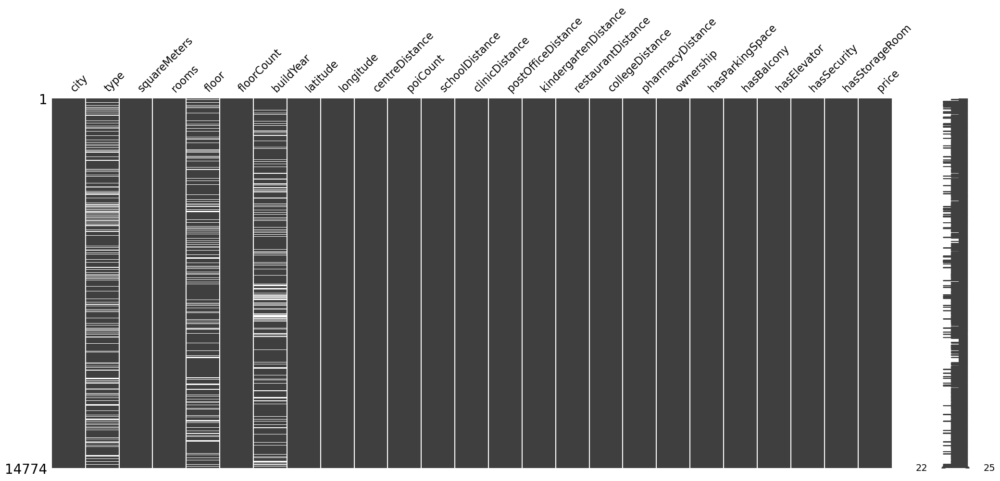

In [40]:
import missingno as msno
msno.matrix(df2)
plt.show()

### drop columns and duplicates 

In [3]:
df2.drop(columns=['condition' , 'id' , 'buildingMaterial'], inplace=True)    #many nulls 

In [4]:
df2.drop_duplicates(inplace=True) # duplicate data 

In [5]:
df2.isnull().mean()*100

city                     0.000000
type                    21.979648
squareMeters             0.000000
rooms                    0.000000
floor                   18.038853
floorCount               1.214924
buildYear               16.102374
latitude                 0.000000
longitude                0.000000
centreDistance           0.000000
poiCount                 0.000000
schoolDistance           0.098674
clinicDistance           0.357693
postOfficeDistance       0.129510
kindergartenDistance     0.141844
restaurantDistance       0.240518
collegeDistance          2.806044
pharmacyDistance         0.135677
ownership                0.000000
hasParkingSpace          0.000000
hasBalcony               0.000000
hasElevator              5.192723
hasSecurity              0.000000
hasStorageRoom           0.000000
price                    0.000000
dtype: float64

In [6]:
df2.dropna(subset=['clinicDistance', 'hasElevator' , 'pharmacyDistance' ,
                   'kindergartenDistance', 'postOfficeDistance' ,
                   'hasParkingSpace', 'floorCount' ,'schoolDistance'
                   ,'hasElevator' , 'restaurantDistance' , 'collegeDistance'], inplace=True) # row null


In [7]:
df2.isnull().sum()

city                       0
type                    3029
squareMeters               0
rooms                      0
floor                   2480
floorCount                 0
buildYear               2201
latitude                   0
longitude                  0
centreDistance             0
poiCount                   0
schoolDistance             0
clinicDistance             0
postOfficeDistance         0
kindergartenDistance       0
restaurantDistance         0
collegeDistance            0
pharmacyDistance           0
ownership                  0
hasParkingSpace            0
hasBalcony                 0
hasElevator                0
hasSecurity                0
hasStorageRoom             0
price                      0
dtype: int64

### train test split

In [8]:
from sklearn.model_selection import train_test_split
x  = df2.drop(columns=['price'])
y= df2['price']

#cross validation and train test split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)


### fill missing values

In [9]:
x_train['type'].fillna(x_train['type'].mode()[0] , inplace=True)           
x_train['floor'].fillna(x_train['floor'].mode()[0] ,inplace = True)
x_train['floorCount'].fillna(x_train['floorCount'].mode()[0] ,inplace = True)
x_train['buildYear'].fillna(x_train['buildYear'].mode()[0] , inplace=True)

x_test['type'].fillna(x_train['type'].mode()[0] , inplace=True)           
x_test['floor'].fillna(x_train['floor'].mode()[0] ,inplace = True)
x_test['floorCount'].fillna(x_train['floorCount'].mode()[0] ,inplace = True)
x_test['buildYear'].fillna(x_train['buildYear'].mode()[0] , inplace=True)




### feature selection

C:\Users\Maydoum\AppData\Local\Temp\ipykernel_7872\947640352.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df2.corr(), cmap = 'Blues', annot = True, fmt = '.2f')


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5]),
 [Text(0.5, 0, 'squareMeters'),
  Text(1.5, 0, 'rooms'),
  Text(2.5, 0, 'floor'),
  Text(3.5, 0, 'floorCount'),
  Text(4.5, 0, 'buildYear'),
  Text(5.5, 0, 'latitude'),
  Text(6.5, 0, 'longitude'),
  Text(7.5, 0, 'centreDistance'),
  Text(8.5, 0, 'poiCount'),
  Text(9.5, 0, 'schoolDistance'),
  Text(10.5, 0, 'clinicDistance'),
  Text(11.5, 0, 'postOfficeDistance'),
  Text(12.5, 0, 'kindergartenDistance'),
  Text(13.5, 0, 'restaurantDistance'),
  Text(14.5, 0, 'collegeDistance'),
  Text(15.5, 0, 'pharmacyDistance'),
  Text(16.5, 0, 'price')])

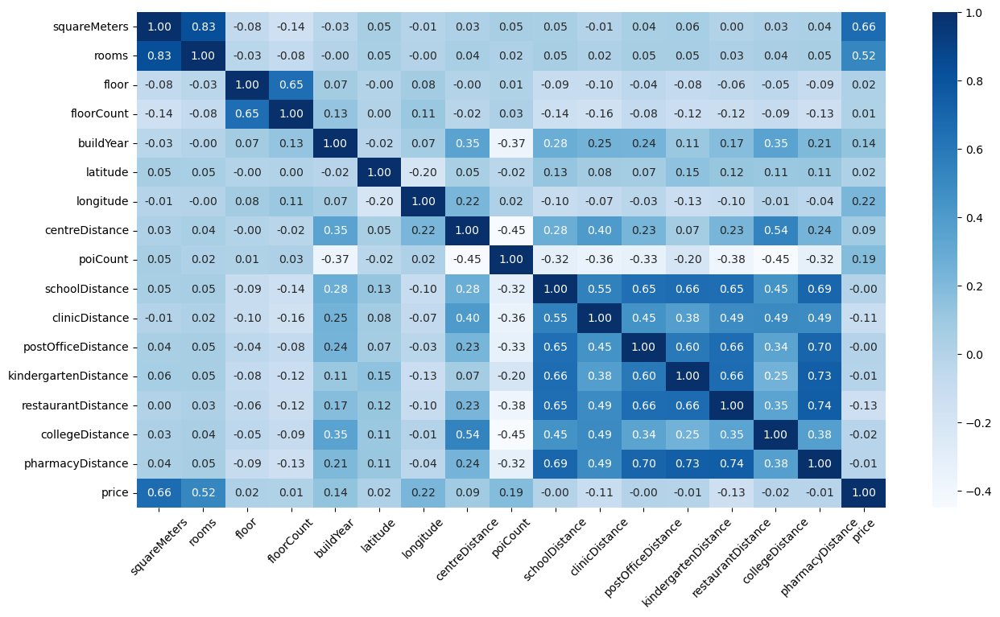

In [38]:

plt.figure(figsize = (15, 8))
sns.heatmap(df2.corr(), cmap = 'Blues', annot = True, fmt = '.2f')
plt.xticks(rotation=45)



In [11]:
x_train.drop(['rooms'] , axis=1, inplace=True) #highly correlated
x_test.drop(['rooms'] , axis=1, inplace=True) 

### drop columns with low correlation

In [12]:
x_train.drop(columns=['hasSecurity' , 'ownership' , 'hasParkingSpace' 
                  , 'hasElevator' ,'hasStorageRoom' , 'hasBalcony'],inplace=True)  
x_test.drop(columns=['hasSecurity' , 'ownership' , 'hasParkingSpace'    
                  , 'hasElevator' ,'hasStorageRoom' , 'hasBalcony'], inplace=True)  

In [13]:
x_train.columns


Index(['city', 'type', 'squareMeters', 'floor', 'floorCount', 'buildYear',
       'latitude', 'longitude', 'centreDistance', 'poiCount', 'schoolDistance',
       'clinicDistance', 'postOfficeDistance', 'kindergartenDistance',
       'restaurantDistance', 'collegeDistance', 'pharmacyDistance'],
      dtype='object')

### encoding

In [14]:
num_col = x_train.select_dtypes(exclude=['object']).columns

cat_col = x_train.select_dtypes(include=['object']).columns

In [15]:
num_col

Index(['squareMeters', 'floor', 'floorCount', 'buildYear', 'latitude',
       'longitude', 'centreDistance', 'poiCount', 'schoolDistance',
       'clinicDistance', 'postOfficeDistance', 'kindergartenDistance',
       'restaurantDistance', 'collegeDistance', 'pharmacyDistance'],
      dtype='object')

In [16]:
cat_col

Index(['city', 'type'], dtype='object')

In [17]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from category_encoders import BinaryEncoder
preproceesor = ColumnTransformer([("num", RobustScaler(), num_col), ("cat", BinaryEncoder(), cat_col)])
x_train_pre  = preproceesor.fit_transform(x_train)
x_test_pre = preproceesor.transform(x_test)



In [39]:
for col in x_train.columns:
     px.scatter(df2 , x=col , y='price').show()

## modeling 

### using linear regression

In [19]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import  cross_val_score
lr = LinearRegression()
scores_lr = cross_val_score(lr, x_train_pre, y_train, cv=5 , scoring='r2')


print(scores_lr)
print(scores_lr.mean())


[0.71512332 0.72452953 0.72249207 0.72652164 0.7340376 ]
0.7245408334547113


### polynomial features

In [34]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree=3)
scores_poly  = cross_val_score(lr ,poly.fit_transform(x_train_pre),  y_train, cv=5 , scoring='r2')
print(scores_poly)
print(scores_poly.mean())


[0.83025463 0.83392742 0.81067755 0.8183831  0.8408787 ]
0.8268242773808719


### SVR Linear

In [21]:
from sklearn.svm import SVR
sv = SVR()
scores_svr = cross_val_score(sv, x_train_pre, y_train, cv=5 , scoring='r2')
print(scores_svr)
print(scores_svr.mean())





[-0.0498189  -0.05411357 -0.04870578 -0.04583649 -0.06158545]
-0.05201203724247261


### KNN

In [22]:
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor()
scores_knn = cross_val_score(knn, x_train_pre, y_train, cv=5 , scoring='r2')
print(scores_knn)
print(scores_knn.mean())

[0.76110887 0.77609359 0.78725463 0.77081155 0.78157109]
0.7753679475554799


In [23]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

# Define the pipeline
pipe = Pipeline(steps=[('knn', KNeighborsRegressor())])

# Define the parameter grid
model_params = {'knn__n_neighbors': [3, 5, 7],
                'knn__weights': ['uniform', 'distance'],
                'knn__p': [1, 2]
               }

# Perform grid search with cross-validation
grid_search = GridSearchCV(pipe, model_params, cv=5, scoring='r2')

# Fit the model
grid_search.fit(x_train_pre, y_train)

# Print the best score and parameters
print('Best Score:', grid_search.best_score_ * 100)
print('Best Params:', grid_search.best_params_)


Best Score: 79.3711402192182
Best Params: {'knn__n_neighbors': 5, 'knn__p': 2, 'knn__weights': 'distance'}


### decision tree

In [24]:
from sklearn.tree import DecisionTreeRegressor

dt = DecisionTreeRegressor()
scores_tree = cross_val_score(dt, x_train_pre, y_train, cv=5 , scoring='r2')
print(scores_tree)
print(scores_tree.mean())

[0.7241768  0.69074726 0.73329553 0.71059346 0.73491905]
0.7187464223359781


### xgboost

In [27]:
#xgboost

from xgboost import XGBRegressor
xgb = XGBRegressor()
xgb.fit(x_train_pre, y_train)
scores_xgb = cross_val_score(xgb, x_train_pre, y_train, cv=5 , scoring='r2' )
print(scores_xgb)
print(scores_xgb.mean())

[0.8786824  0.88174907 0.87933147 0.87589411 0.88108459]
0.8793483271948548


### random forest

In [30]:
# random forest

from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor()


scores_forest = cross_val_score(rf, x_train_pre, y_train, cv=5 , scoring='r2')
print(scores_forest)
print(scores_forest.mean())

[0.86982878 0.86414806 0.86713785 0.86997862 0.86612914]
0.8674444882759555


In [31]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np

# Define the model
rf = RandomForestRegressor()

# Set up the hyperparameter grid
param_grid = {
    'n_estimators': [100],  # Number of trees in the forest
    'max_depth': [ 10 , 20 ,30],  # Maximum depth of the tree
    'min_samples_split': [2],  
}

# Set up the GridSearchCV object
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(x_train_pre, y_train)

# Print the best parameters and the best score
print("Best Parameters: ", grid_search.best_params_)
print("Best R^2 Score: ", grid_search.best_score_)
#0.8709556979977731


Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best Parameters:  {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 100}
Best R^2 Score:  0.8674273384476423


### Bayesian Regression

In [32]:
#Bayesian Regression

from sklearn.linear_model import BayesianRidge

bay = BayesianRidge()
scoresbayes = cross_val_score(bay, x_train_pre, y_train, cv=5 , scoring='r2')
print(scoresbayes)
print(scoresbayes.mean())

[0.71510119 0.72453586 0.7225198  0.72657806 0.73397549]
0.7245420807513294


### conlusion 

In [36]:
scores = pd.DataFrame({'model' : ['Linear Regression' , 'Polynomial Regression' , 'SVR' , 'KNN' , 'Decision Tree' , 'XGBoost' , 'Random Forest' , 'Bayesian Regression'],
                       'scores' : [scores_lr.mean() , scores_poly.mean() , scores_svr.mean() ,
                                    scores_knn.mean() , scores_tree.mean() , scores_xgb.mean() , scores_forest.mean() ,
                                    scoresbayes.mean() ]})
scores 

,model,scores
0,Linear Regression,0.724541
1,Polynomial Regression,0.826824
2,SVR,-0.052012
3,KNN,0.775368
4,Decision Tree,0.718746
5,XGBoost,0.879348
6,Random Forest,0.867444
7,Bayesian Regression,0.724542


### best model

In [ ]:
# from xgboost import XGBRegressor
# xgb = XGBRegressor()

y_pred_test = xgb.predict(x_test_pre)
print("R2 Test:", r2_score(y_test, y_pred_test) * 100)
print("MSE Test:", mean_squared_error(y_test, y_pred_test))


R2 Test: 88.62392309709338
MSE Test: 21158200191.63865


In [ ]:
## save the model and preprocesor

import pickle
pickle.dump(xgb, open('xgb1.pkl', 'wb'))
pickle.dump(preproceesor , open('preproceesor.pkl', 'wb'))


In [ ]:
# test new data 
new_data = pd.DataFrame({
    'city': ['lodz'],
    'type': ['blockOfFlats'],
    'squareMeters': [54.66],
    'rooms': [3.0],
    'floor': [10.0],
    'floorCount': [11.0],
    'buildYear': [1976.0],
    'latitude': [51.7509],
    'longitude': [19.42446],
    'centreDistance': [3.99],
    'poiCount': [16.0],
    'schoolDistance': [0.115],
    'clinicDistance': [0.072],
    'postOfficeDistance': [0.108],
    'kindergartenDistance': [0.084],
    'restaurantDistance': [0.072],
    'collegeDistance': [0.072],
    'pharmacyDistance': [0.072],

})


    # Transform the data using the preprocessor
transformed_data = preproceesor.transform(new_data)

    # Predict using the model
prediction = xgb.predict(transformed_data)
print(prediction)

[431739.38]


In [ ]:
#load the model and preprocesor
import pickle
xgb = pickle.load(open('xgb1.pkl', 'rb'))
preproceesor = pickle.load(open('preproceesor.pkl', 'rb'))

In [ ]:
!pipreqs